# В данном ноутбуке представлен пример алгоритма Deep Dream

(пока что самая сложная тема)

Алгоритм почти такой же, как и ранее разобранная визуализация фильтров слоев (глава 5): происходит градиентное восхождение по входным данным и максимизируется значение каждого фильтра каждого слоя сети.

Входные изображение обрабатываются в разных масштабах, чтобы получить лучшую визуализацию.


Загрузка сети 

In [ ]:
from keras.applications import inception_v3
from keras import backend as K
import tensorflow as tf
tf.compat.v1.disable_eager_execution()

# обучение не должно происходить, обозначим это в настройках keras
K.set_learning_phase(0)

model = inception_v3.InceptionV3(
    weights='imagenet',
    include_top=False
)

model.summary()


Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d_282 (Conv2D)             (None, None, None, 3 864         input_5[0][0]                    
__________________________________________________________________________________________________
batch_normalization_282 (BatchN (None, None, None, 3 96          conv2d_282[0][0]                 
__________________________________________________________________________________________________
activation_282 (Activation)     (None, None, None, 3 0           batch_normalization_282[0][0]    
_______________________________________________________________________________________

Выбор слоев, создающих визуальные эффекты


In [ ]:
# верхние слои создают эффекты, в которых можно разглядеть некоторые объекты из ImageNet
# нижние слое создают эффекты, порождающие геометрические фигуры

# чем МЕНЬШЕ номер - тем выше слой
# чем БОЛЬШЕ значение - тем быстрее растет потеря

# если номера более-менее одинаковые, то эффект красивее

# словарь: слой - вклад слоя в эффекты
layer_effects = {
    'mixed1': 0.5,
    'mixed2': 0.4,
    'mixed3': 0.6,
    'mixed4': 0.3,
    'mixed5': 0.7,
    'mixed6': 0.8,
    'mixed7': 0.2,
    'mixed8': 0.1,
    'mixed9': 1.0,
}

# Начинается темная магия.....

Определение тензора потерь

In [ ]:
# тензор потерь - взвешенная сумма L2 норм активаций слоев, представленных выше

# словарь: имя слоя - слой
layer_dict = dict([(layer.name, layer) for layer in model.layers])
# величина потерь определяется добавлением вклада слоя в эту переменную
loss = K.variable(0.)
for layer_name in layer_effects.keys():
  coeff = layer_effects[layer_name]
  # получение активационной функции слоя
  activation = layer_dict[layer_name].output
  # K.shape возвращает форму переменной или тензора
  # K.cast превращает переменную в тензор заданного типа данных
  # K.prod перемножает значения в тензоре вдоль определенной оси
  scaling = K.prod(K.cast(K.shape(activation), 'float32'))
  # добавление L2 нормы признаков к потерям
  # рамка кадра убирается, чтобы не мешать
  loss = loss + coeff * K.sum(K.square(activation[:, 2: -2, 2: -2, :])) / scaling

Процесс градиентного восхождения

In [ ]:
# тензор хранит сгенерированные изображения
dream = model.input

# вычисление градиентов изображения с учетом потерь
grads = K.gradients(loss, dream)[0]

# нормализация градиентов (ВАЖНО!)
grads /= K.maximum(K.mean(K.abs(grads)), 1e-7)

# функция извлекает потери и градиенты для заданного изображения
fetch_loss_and_grads = K.function([dream], [loss, grads])

def eval_loss_and_grads(x):
  outs = fetch_loss_and_grads([x])
  loss_value = outs[0]
  grad_values = outs[1]
  return loss_value, grad_values

# функиця выполняет заданное количество операций градиентного восхождения
def gradient_ascent(x, iterations, step, max_loss=None):
  for i in range(iterations):
    loss_value, grad_values = eval_loss_and_grads(x)
    if max_loss is not None and loss_value > max_loss:
      break
    print(f"----Iteration {i}, loss {loss_value}")
    x += step * grad_values
  return x


# Сам алгоритм DeepDream

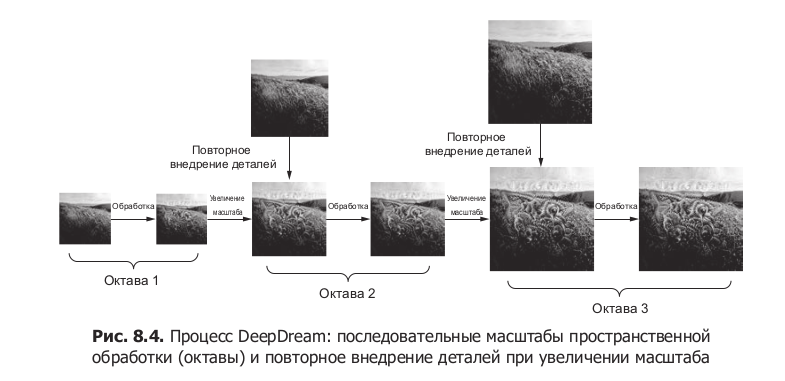

Определим список масштабов (октав), в которых будет обрабатываться изображение:
каждое последующие будет в 1.4 раза больше предыдущего.

Для каждого масштаба выполняется градиентое восхождение для максимизации функции потерь, полученной на предыдущем масштабе.

Однако при увеличении изображения у него будут теряться детали(четкость). Этого можно избежать, если после каждого увеличения вновь внедрять эти детали в изображение.

Если у нас есть маленькое изображение S и большое L, то если мы вычислим разницу между L и S, то она и будет показывать потери деталей.

Вспомогательные фукнции

In [ ]:
import scipy
import cv2

from keras.preprocessing import image

# функция меняет размер фото
def resize_img(img, size):
  img = np.copy(img)
  factors = (
      1, 
      float(size[0]) / img.shape[1],
      float(size[1]) / img.shape[2],
      1
  )
  return scipy.ndimage.zoom(img, factors, order=1)

# фукнция сохраняет изображение в файл
def save_img(img, file_name):
  pil_img = deprocess_image(np.copy(img))
  cv2.imwrite(file_name, pil_img)

# функция превращает изображение в тензор, который сеть может обработать
def preprocess_image(image_path):
  img = image.load_img(image_path)
  img = image.img_to_array(img)
  img = np.expand_dims(img, axis=0)
  img = inception_v3.preprocess_input(img)
  return img

# превращает тензор в изображение
def deprocess_image(x):
  if K.image_data_format() == 'channels_first':
    x = x.reshape((3, x.shape[2], x.shape[3]))
    x = x.transpose((1, 2, 0))
  else:
    x = x.reshape((x.shape[1], x.shape[2], 3))
  x /= 2.
  x += 0.5
  x *= 255.
  x = np.clip(x, 0, 255).astype('uint8')
  return x



Градиентное восхождение через последовательность масштабов

=================START DREAMING=================
Processing image with shape (612, 1158)
----Iteration 0, loss 1.1578179597854614
----Iteration 1, loss 1.2995835542678833
----Iteration 2, loss 1.5232911109924316
----Iteration 3, loss 1.7814699411392212
----Iteration 4, loss 2.053583860397339
----Iteration 5, loss 2.332188367843628
----Iteration 6, loss 2.5966994762420654
----Iteration 7, loss 2.865427255630493
----Iteration 8, loss 3.112647771835327
----Iteration 9, loss 3.364302396774292


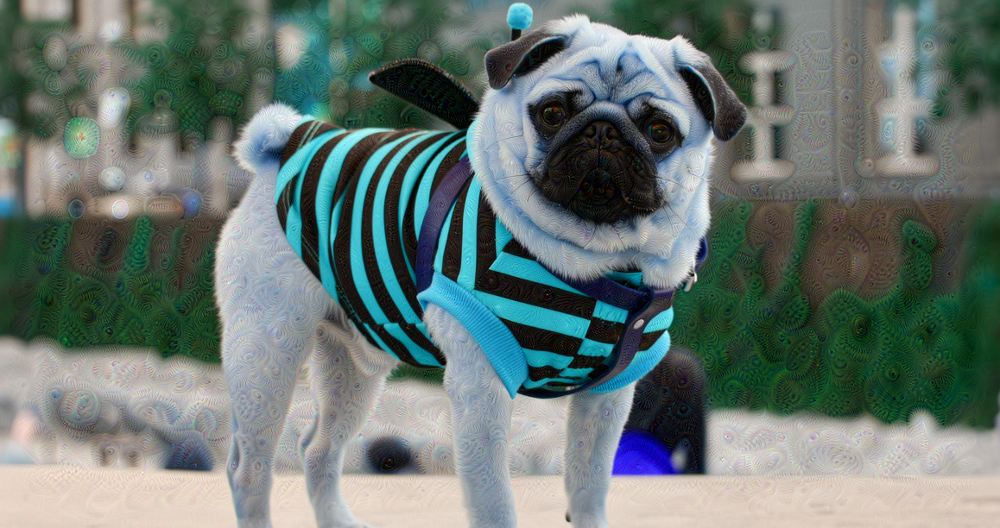

Processing image with shape (857, 1622)
----Iteration 0, loss 1.6256901025772095
----Iteration 1, loss 2.0266411304473877
----Iteration 2, loss 2.3686745166778564
----Iteration 3, loss 2.6882429122924805
----Iteration 4, loss 3.0055129528045654
----Iteration 5, loss 3.307762622833252
----Iteration 6, loss 3.5938124656677246
----Iteration 7, loss 3.8771860599517822
----Iteration 8, loss 4.151001930236816
----Iteration 9, loss 4.416585922241211


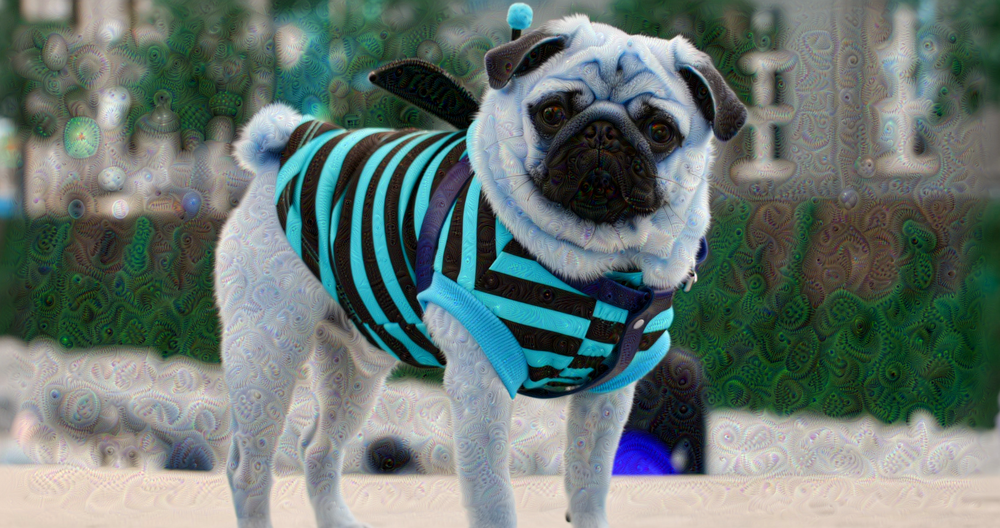

Processing image with shape (1200, 2271)
----Iteration 0, loss 1.731324553489685
----Iteration 1, loss 2.2060539722442627
----Iteration 2, loss 2.5923964977264404
----Iteration 3, loss 2.9482481479644775
----Iteration 4, loss 3.29683256149292
----Iteration 5, loss 3.631878137588501
----Iteration 6, loss 3.952866315841675
----Iteration 7, loss 4.2595720291137695
----Iteration 8, loss 4.553264617919922
----Iteration 9, loss 4.840122699737549


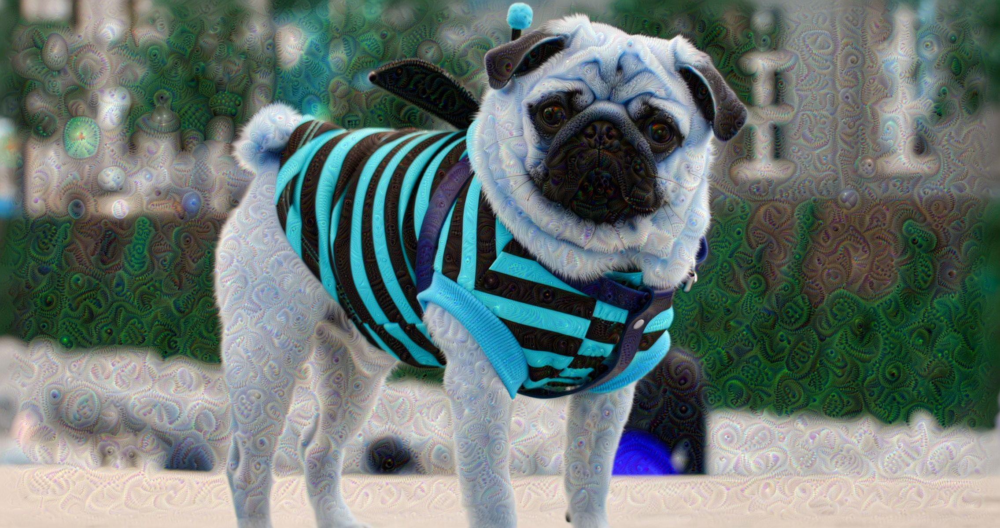

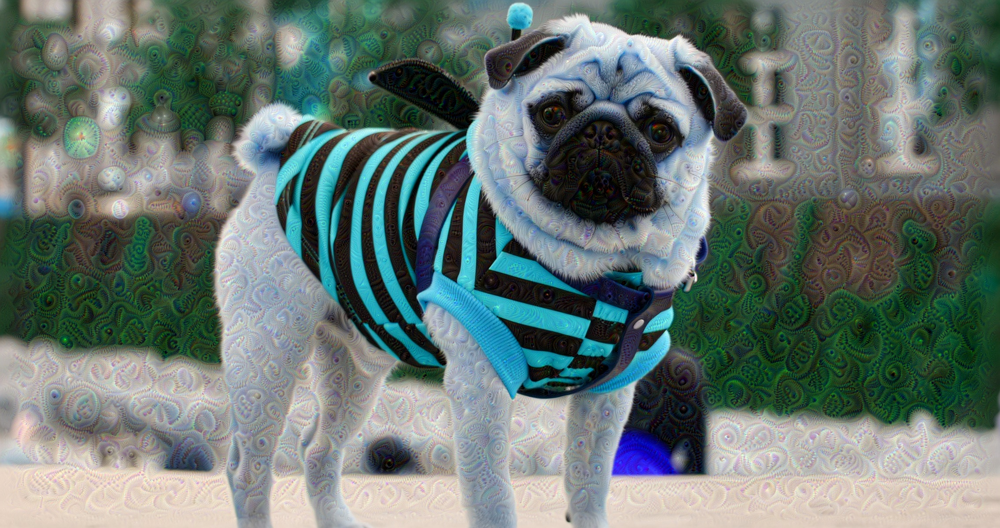

=================STOP DREAMING=================


In [ ]:
import numpy as np
from google.colab.patches import cv2_imshow

# изменяя эти гиперпараметры можно добиваться разных эффектов
# размер шага восхождения - чем больше - тем "гуще" узор
step = 0.01
# количество масштабов, на которое выполняется восхождение
# чем больше - тем крупнее узор и быстрее растет потеря
num_octave = 3
# отношение между соседними масштабами
octave_scale = 1.4
# число шагов восхождения для каждого масштаба
iterations = 10

# если величина потерь станет больше 10, то надо прекращать работу, чтобы не получить
# непонятные артефакты
# чем выше - тем больше узора, картинка превращается в кашу
max_loss = 10

# путь к файлу с изображением
base_image_path = '/content/drive/MyDrive/StudyingKeras/Deep Dream/input/pug.jpg'

# загрузка изображения в массив numpy 
img = preprocess_image(base_image_path)

original_shape = img.shape[1:3]
successive_shapes = [original_shape]

# подготовка списка кортежей shape, определяющих разные масштабы 
# для градиентного восхождения
for i in range(1, num_octave):
  shape = tuple([int(dim / (octave_scale ** i)) for dim in original_shape])
  successive_shapes.append(shape)
# переворачивание этого списка, чтобы кортежи шли в порядке 
# возрастания масштаба
successive_shapes = successive_shapes[::-1]

# уменьшение изображения до наименьшего масштаба
original_img = np.copy(img)
shrunk_original_img = resize_img(img, successive_shapes[0])

print("=================START DREAMING=================")
for shape in successive_shapes:
  print(f"Processing image with shape {shape}")
  # увеличение масштаба изображения
  img = resize_img(img, shape)
  # выполнение градиентного восхождения с изменением изображения
  img = gradient_ascent(img, iterations=iterations, step=step, max_loss=max_loss)
  upscaled_shrunk_original_img = resize_img(shrunk_original_img, shape)
  # вычисление высококачественной версии исходного изображения с заданными размерами
  same_size_original = resize_img(original_img, shape)
  # вычисление потерянных в результате масштабирования деталей
  lost_detail = same_size_original - upscaled_shrunk_original_img

  img += lost_detail
  shrunk_original_img = resize_img(original_img, shape)
  clear_img = deprocess_image(np.copy(img))
  cv2_imshow(clear_img)

save_img(img, file_name='/content/drive/MyDrive/StudyingKeras/Deep Dream/output/final_dream.jpg')

img_to_show = cv2.imread('/content/drive/MyDrive/StudyingKeras/Deep Dream/output/final_dream.jpg')
cv2_imshow(img_to_show)
print("=================STOP DREAMING=================")